In [1]:
import cv2
import matplotlib.pyplot as plt 
import math
import numpy as np

from os import listdir
from os.path import isfile, join

In [2]:
img_dir = '../resources/Proj1.2'
imgs = [f'{img_dir}/{f}' for f in listdir(img_dir) if isfile(join(img_dir, f))]
img_mats_BGR = [cv2.imread(image) for image in imgs]
img_mats_gray = [cv2.imread(image, cv2.IMREAD_GRAYSCALE) for image in imgs]

In [3]:
def show_images(images, list_captions=None, grid_size=(1, 4), figsize=(10, 10)):
    rows, cols = grid_size
    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    if rows * cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, image in enumerate(images):
        if isinstance(image, str):
            image = cv2.imread(image)
        if i < len(axes) and image is not None:
            axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            if list_captions:
                axes[i].set_title(list_captions[i], fontsize=10)
            axes[i].axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

In [4]:
def show_plots(plot_functions, grid_size=(1, 4), figsize=(10, 10)):
    rows, cols = grid_size
    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    if rows * cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, plot_func in enumerate(plot_functions):
        if i < len(axes):
            plot_func(axes[i])
            axes[i].axis('on')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

In [5]:
def scale_img(image, uint8=True):
    min_val = np.min(image)
    max_val = np.max(image)
    scaled_image = 255 * (image - min_val) / (max_val - min_val)
    if uint8:
        return scaled_image.astype(np.uint8)
    scaled_image[scaled_image < 0] = 0
    scaled_image[scaled_image > 255] = 255
    return scaled_image

In [6]:
def binarize_by_percentile(image, p):
    threshold_value = np.percentile(image, p)
    binary_image = np.where(image < threshold_value, 0, 255).astype(np.uint8)
    return binary_image

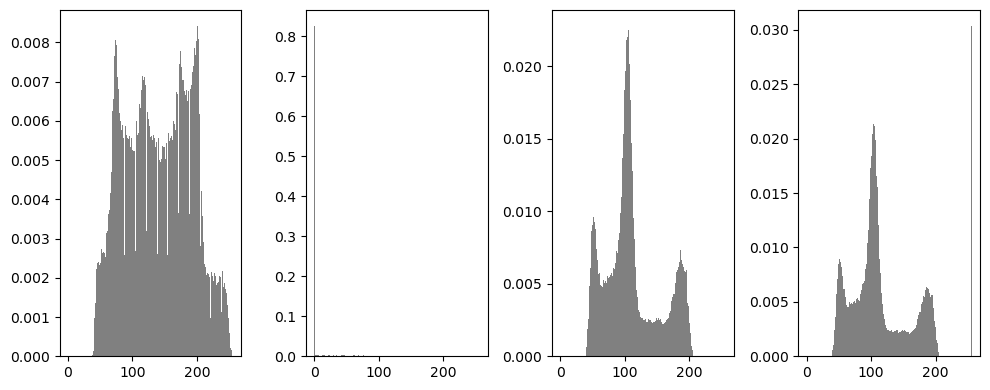

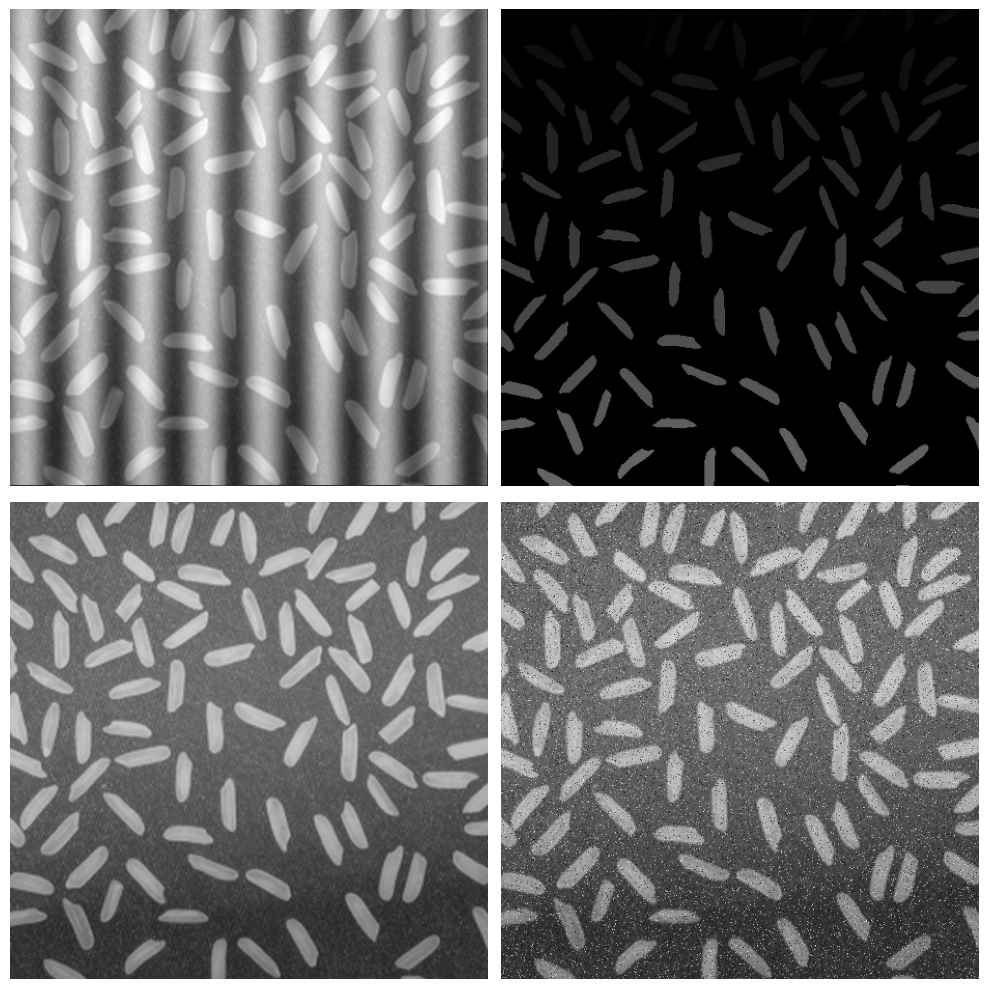

In [7]:
plot_functions = [
    lambda ax, img=img: ax.hist(img.flatten(), 256, [0, 256], color='gray', density=True) for img in img_mats_BGR
]

show_plots(plot_functions, figsize=(10, 4))
show_images(img_mats_gray, grid_size=(2, 2))

### Remove sinusoidal noise using FFT and magnitude spectrum manipulation

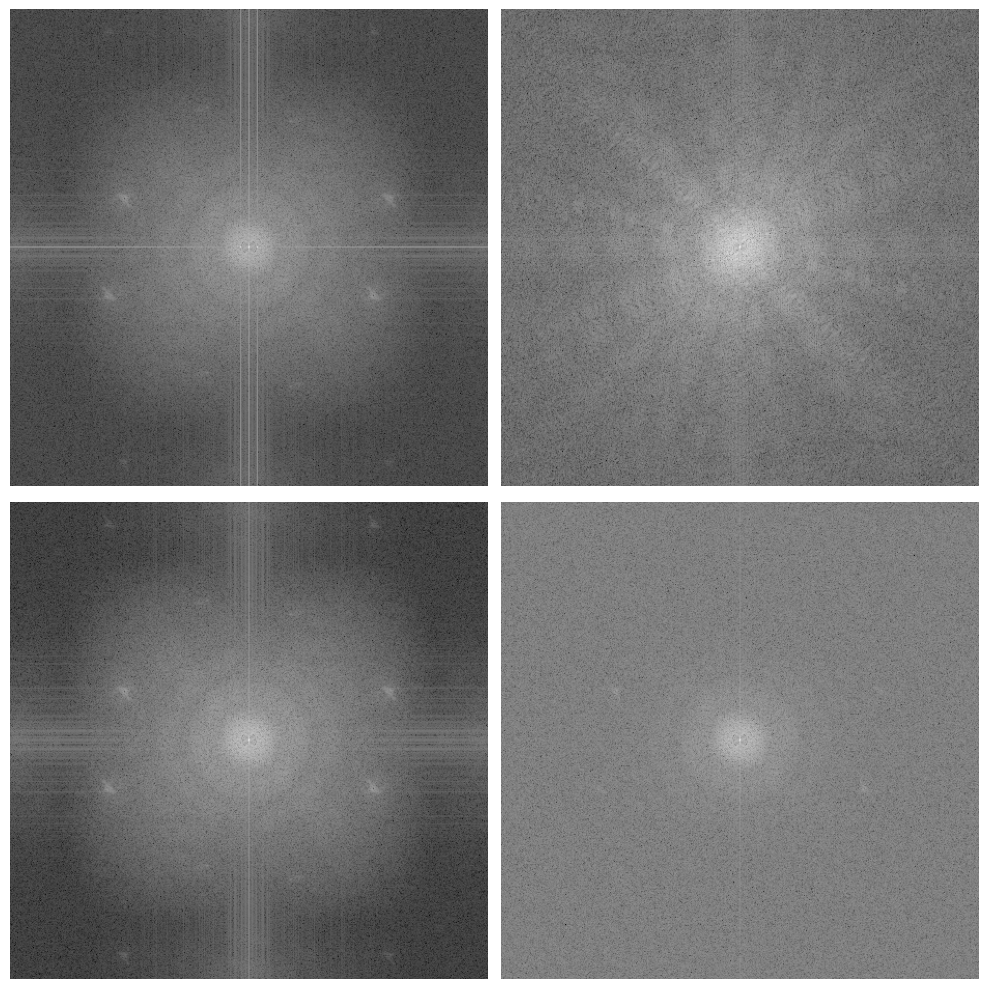

In [8]:
img_mats_fft = []
for image in img_mats_gray:
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log(np.abs(fshift))
    img_mats_fft.append(scale_img(magnitude_spectrum))

show_images(img_mats_fft, grid_size=(2, 2))

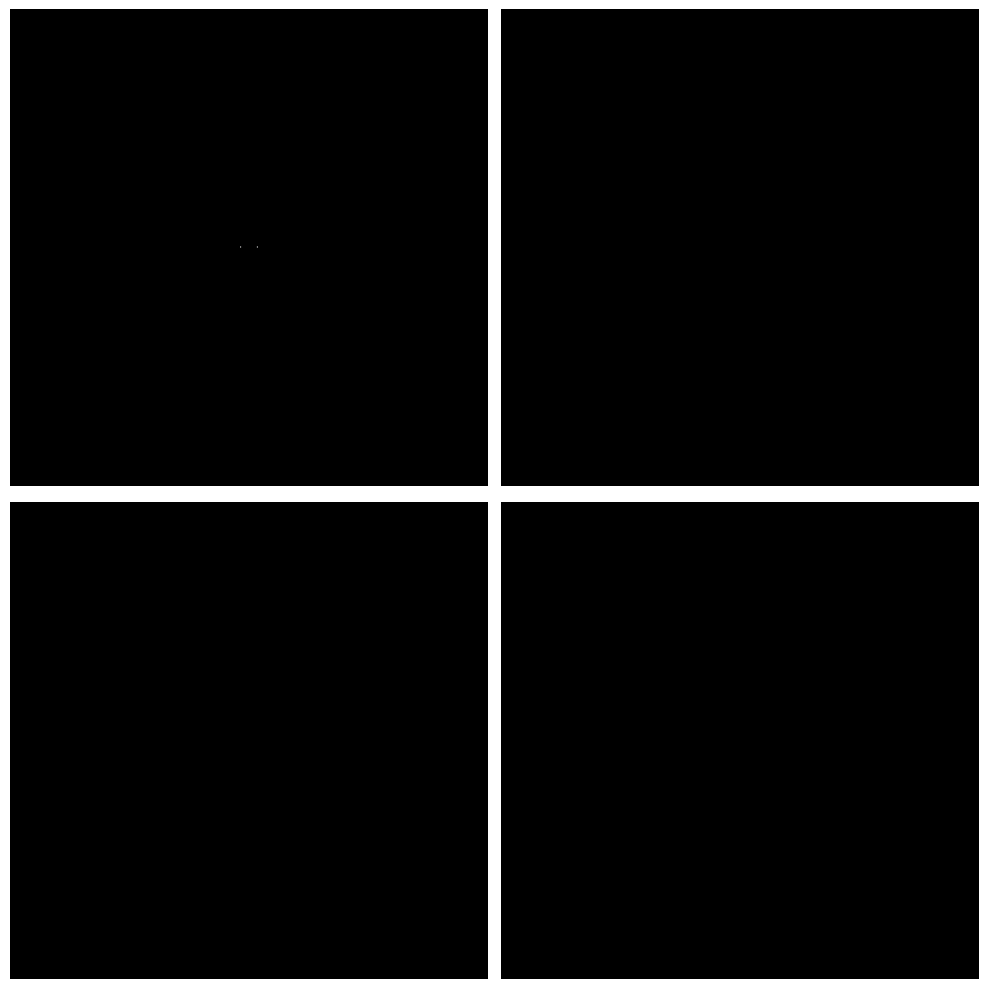

In [9]:
fft_masks_1 = []
for test_img in img_mats_gray:

    f = np.fft.fft2(test_img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log(np.abs(fshift))
    magnitude_spectrum = scale_img(magnitude_spectrum)

    thresh_spectrum = 225
    magnitude_spectrum[magnitude_spectrum <= thresh_spectrum] = 0
    magnitude_spectrum[magnitude_spectrum > thresh_spectrum] = 255


    center_mask_size = (4, 4)
    h, w = test_img.shape[:2]
    center_mask = cv2.rectangle(
        np.zeros_like(test_img),
        ((w - center_mask_size[0])//2, (h - center_mask_size[1])//2),
        ((w + center_mask_size[0])//2, (h + center_mask_size[1])//2),
        (255, 255, 255),
        -1
    )
    center_mask = ~center_mask
    
    magnitude_spectrum_mask = cv2.bitwise_and(magnitude_spectrum, center_mask)
    fft_masks_1.append(magnitude_spectrum_mask)

show_images(fft_masks_1, grid_size=(2, 2))

Here, I tried to remove the remaining bright spots in the magnitude spectrum, aside from the main sinusoidal noise from the first image, to try to remove the periodic noise of the background that came from the cloth texture. The resulting images did not change much, so I decided not to include this in the final result.

In [10]:
# fft_masks_2 = []
# for test_img in img_mats_gray:

#     f = np.fft.fft2(test_img)
#     fshift = np.fft.fftshift(f)
#     magnitude_spectrum = np.log(np.abs(fshift))
#     magnitude_spectrum = scale_img(magnitude_spectrum)

#     clahe = cv2.createCLAHE(clipLimit=8, tileGridSize=(20, 20))
#     magnitude_spectrum = clahe.apply(magnitude_spectrum)
#     magnitude_spectrum = (255*(magnitude_spectrum / 255) ** 2).astype('uint8')

#     kernel = np.ones((5, 5), np.float32)
#     magnitude_spectrum_= cv2.GaussianBlur(
#         magnitude_spectrum, (5, 5), 0
#     )

#     thresh_spectrum = 100
#     magnitude_spectrum[magnitude_spectrum <= thresh_spectrum] = 0
#     magnitude_spectrum[magnitude_spectrum > thresh_spectrum] = 255
#     # magnitude_spectrum = ~magnitude_spectrum

#     magnitude_spectrum = cv2.morphologyEx(
#         magnitude_spectrum, cv2.MORPH_OPEN, kernel
#     )

#     fft_masks_2.append(magnitude_spectrum)

# # show_images(fft_masks_2, grid_size=(1, 4))

In [11]:
# fft_masks = []
# for i in range(4):
#     fft_masks.append(cv2.bitwise_or(fft_masks_1[i], fft_masks_2[i]))

# temp_imgs = []
# temp_imgs.extend(fft_masks_1)
# temp_imgs.extend(fft_masks_2)
# temp_imgs.extend(fft_masks)

# for i in range(4):
#     temp_imgs.append(cv2.bitwise_and(img_mats_fft[i], ~fft_masks[i]))

# show_images(temp_imgs, grid_size=(4, 4))

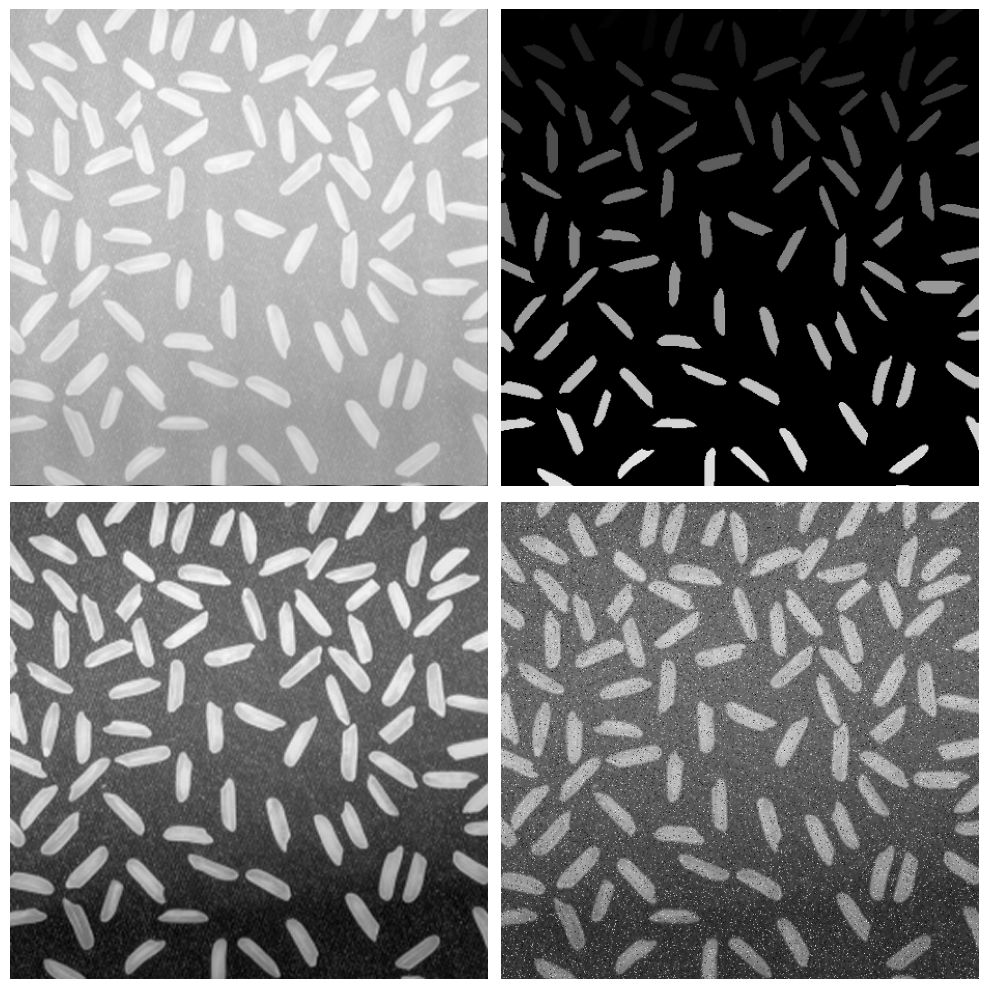

In [12]:
images = []

for i, test_img in enumerate(img_mats_gray):
    f = np.fft.fft2(test_img)


    fshift = np.fft.fftshift(f)
    fshift = fshift * (~fft_masks_1[i]) / 255
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.real(img_back)
    images.append(scale_img(img_back))

show_images(images, grid_size=(2, 2))


### Remove salt-and-pepper noise

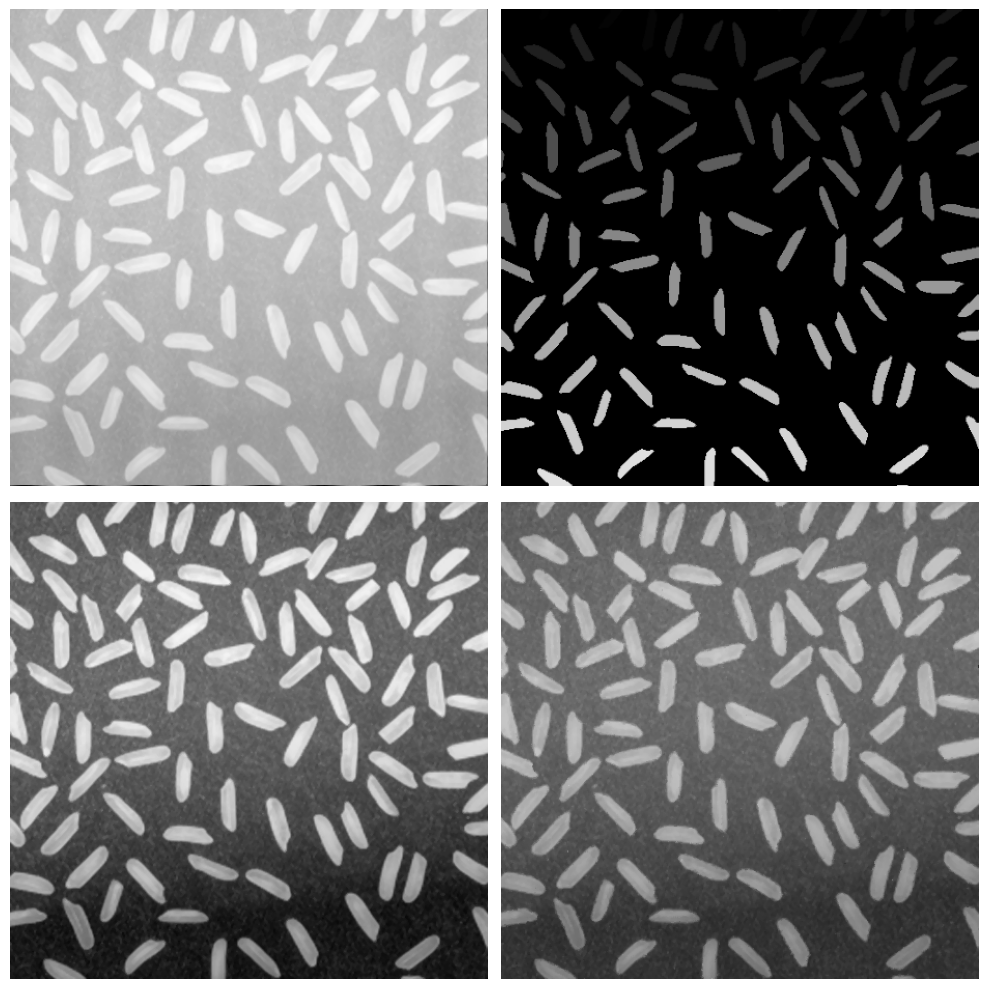

In [13]:
for i, image in enumerate(images):
    images[i] = cv2.medianBlur(image, ksize=3)

show_images(images, grid_size=(2, 2))

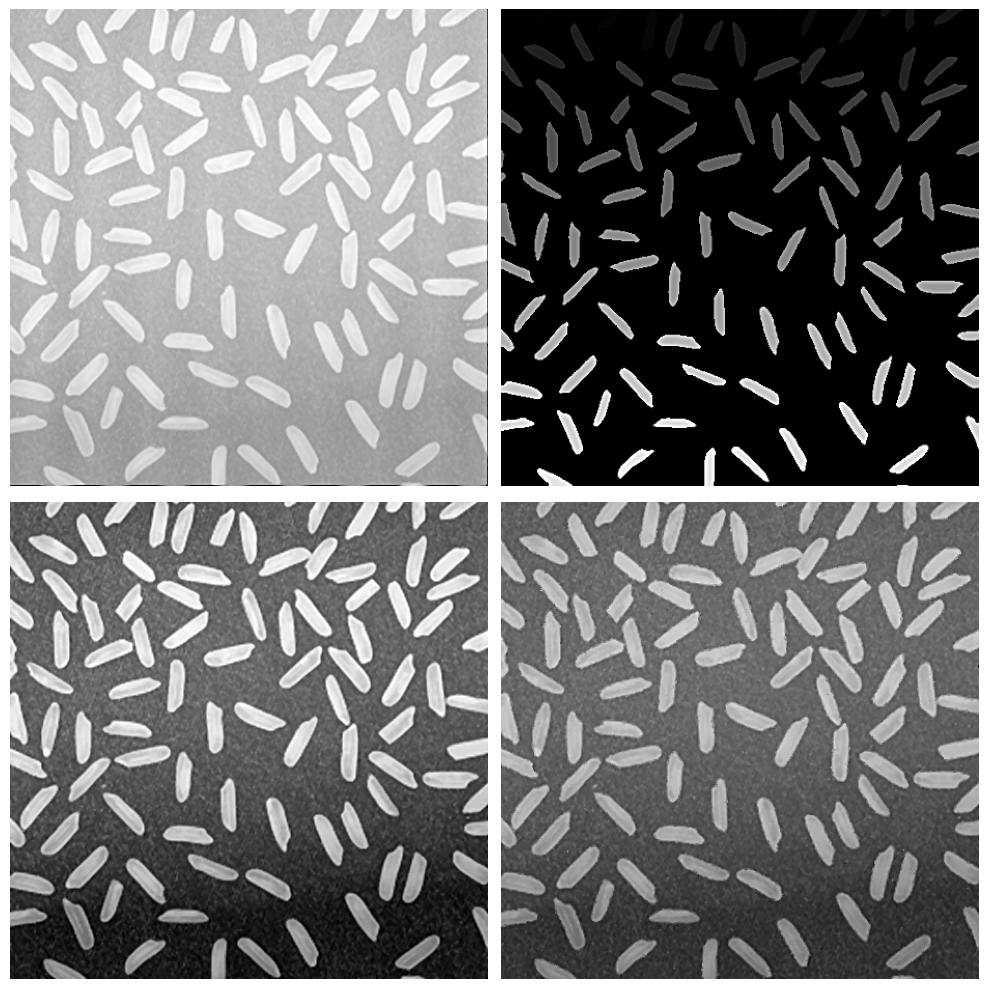

In [14]:

for i, image in enumerate(images):
    gaussian = cv2.GaussianBlur(images[i], (0, 0), 2)
    images[i] = cv2.addWeighted(images[i], 2, gaussian, -1, 0)


show_images(images, grid_size=(2, 2))

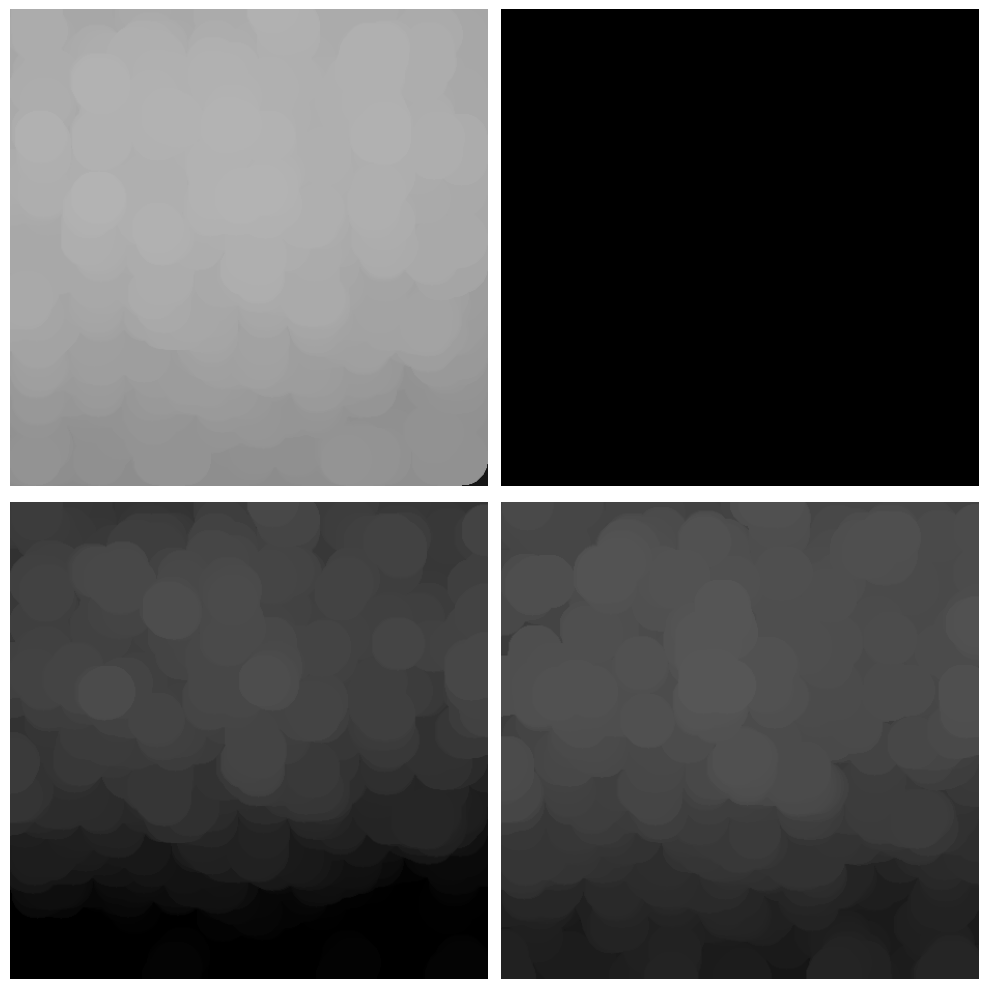

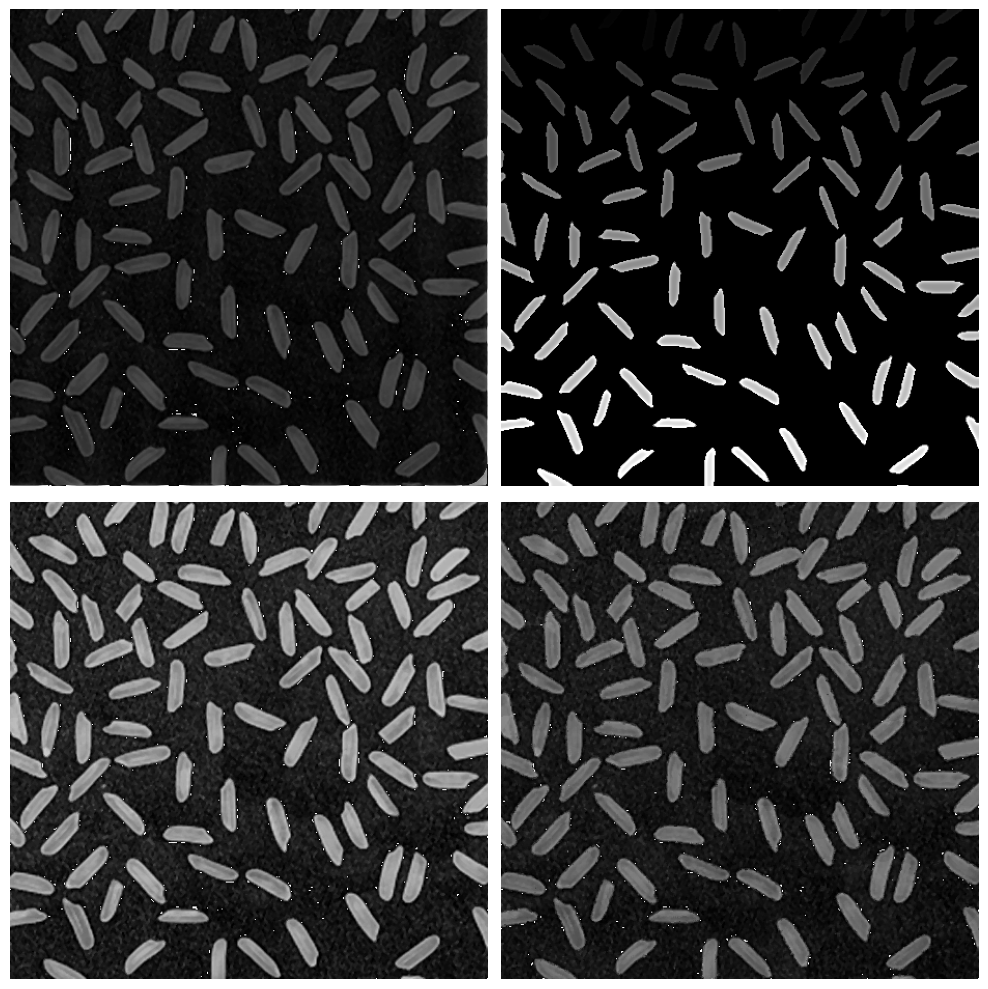

In [15]:
opening_size = 50
opening_kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE, (opening_size, opening_size)
)

backgrounds = []

for i, image in enumerate(images):
    background = cv2.morphologyEx(
        image, op=cv2.MORPH_OPEN, kernel=opening_kernel
    )
    backgrounds.append(background)
    images[i] = image - background
    # Median blur can definitely remove the white dots, but it causes the rice grains to stick to each other.
    # images[i] = cv2.medianBlur(images[i], ksize=3)

show_images(backgrounds, grid_size=(2, 2))
show_images(images, grid_size=(2, 2))

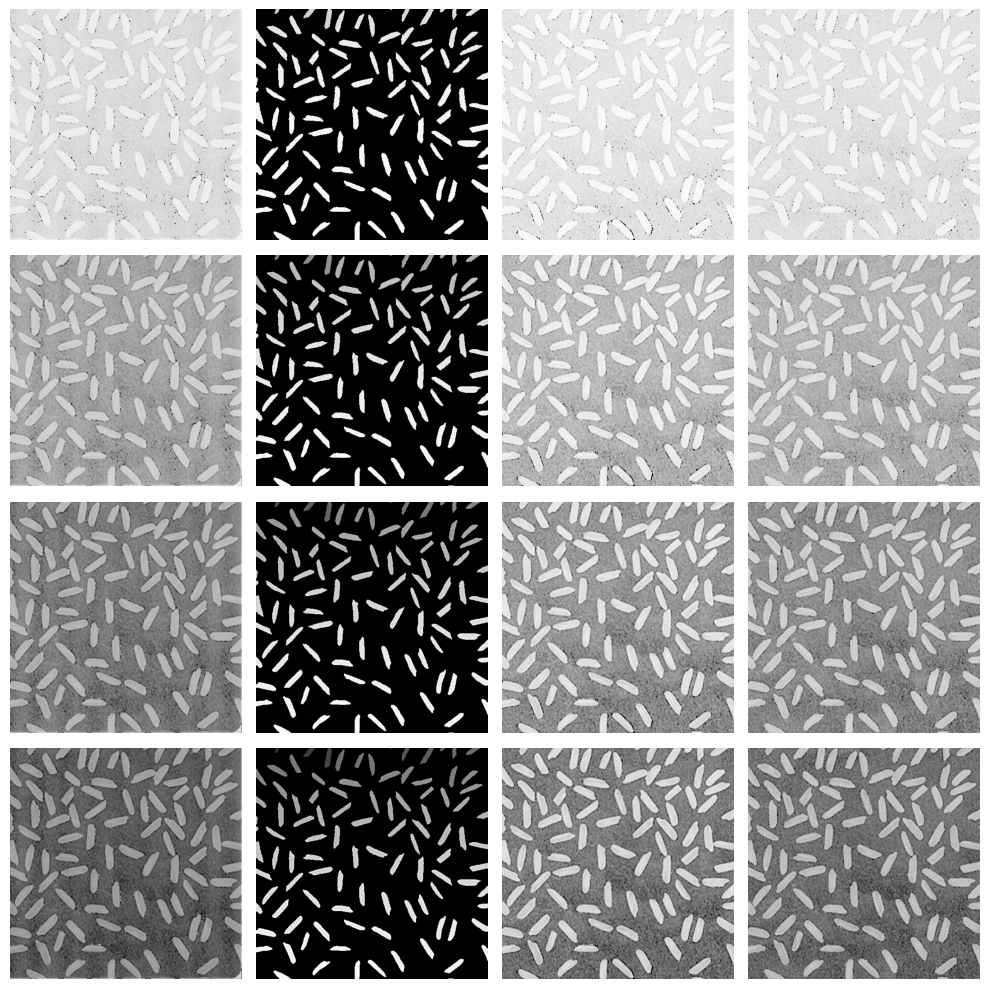

In [16]:
img_mats_hist_gamma = []
for gamma in [0.05, 0.15, 0.25, 0.35]:
    for image in images:
        img_mats_hist_gamma.append(
            (255*(image / 255) ** gamma).astype('uint8')
        )
show_images(img_mats_hist_gamma, grid_size=(4, 4))

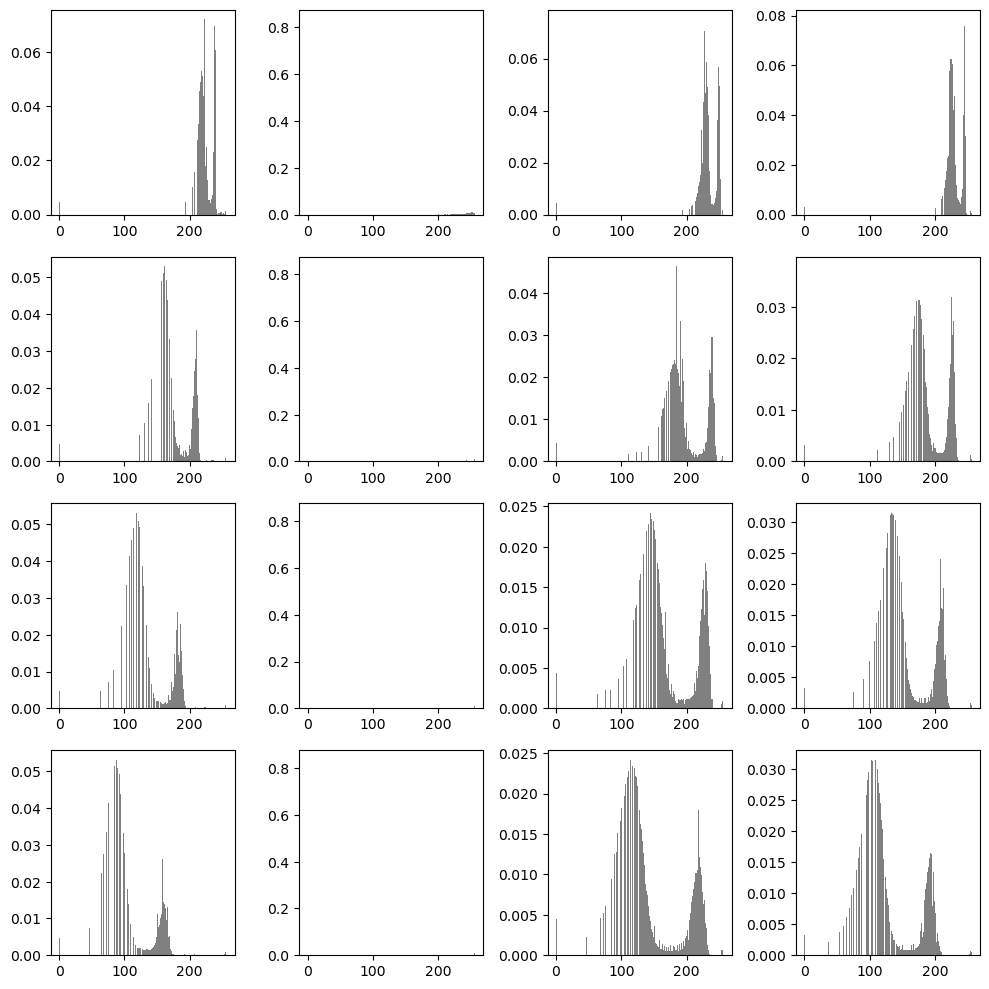

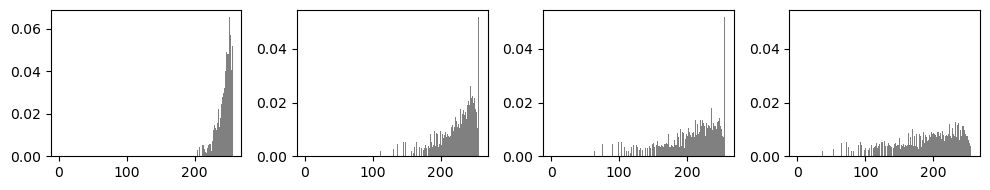

In [17]:
plot_functions = [
    lambda ax, img=img: ax.hist(img.flatten(), 256, [0, 256], color='gray', density=True) for img in img_mats_hist_gamma
]

plot_functions2 = [
    lambda ax, img=img: ax.hist(img.flatten(), 255, [1, 256], color='gray', density=True) for img in img_mats_hist_gamma[1::4]
]

show_plots(plot_functions, grid_size=(4, 4))
show_plots(plot_functions2, grid_size=(1, 4), figsize=(10, 2))

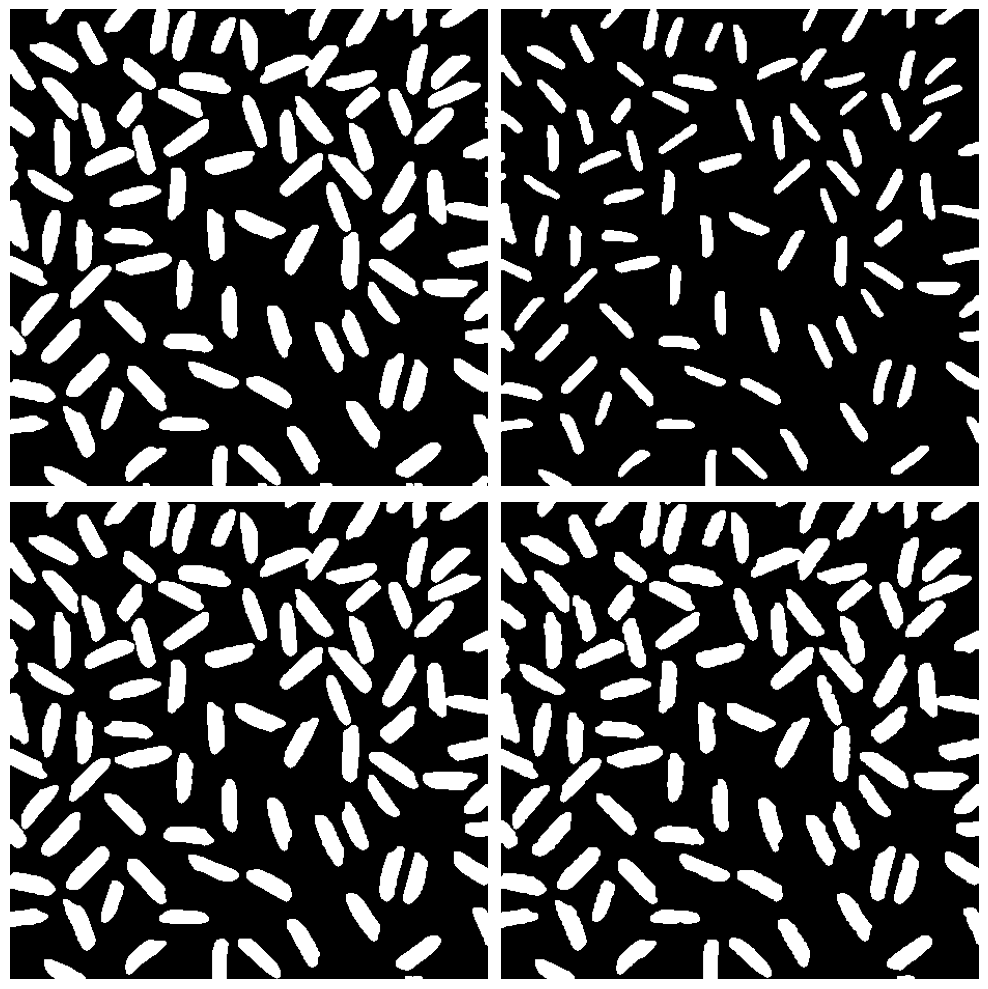

In [18]:
kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE, (6, 6)
)

images_test = [None] * 4

for i, image in enumerate(images):
    images_test[i] = (255*(image / 255) ** 0.15).astype('uint8')

    gaussian = cv2.GaussianBlur(images_test[i], (0, 0), 2)
    images_test[i] = cv2.addWeighted(images_test[i], 2, gaussian, -1, 0)

    # images_test[i] = cv2.morphologyEx(images_test[i], cv2.MORPH_CLOSE, kernel)
    # # images_test[i] = cv2.medianBlur(images_test[i], ksize=11)

    cv2.threshold(images_test[i], 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU, images_test[i])
    images_test[i] = cv2.morphologyEx(images_test[i], cv2.MORPH_OPEN, kernel)
    
    # images_test[i] = cv2.erode(images_test[i], cv2.getStructuringElement(
    #     cv2.MORPH_ELLIPSE, (3, 3)
    # ))
    # images_test[i] = cv2.erode(images_test[i], kernel, iterations=4)

show_images(images_test, grid_size=(2, 2))

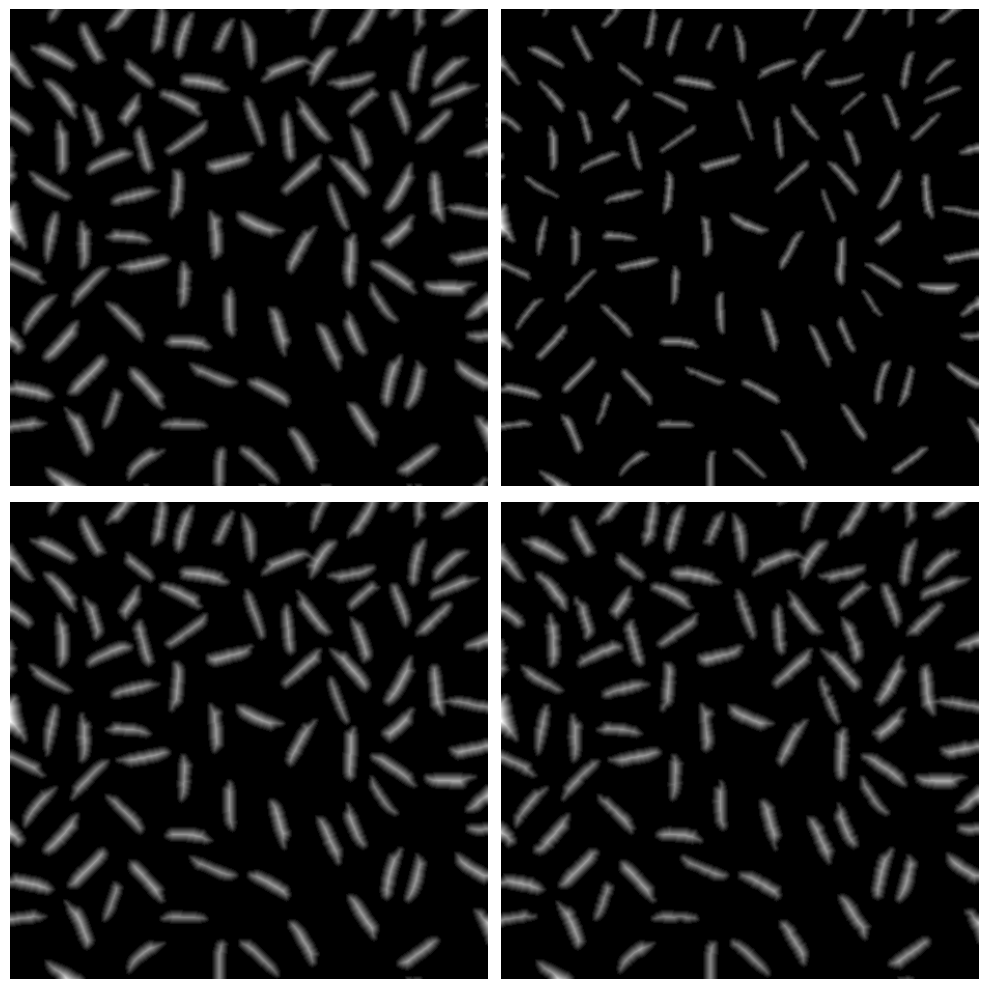

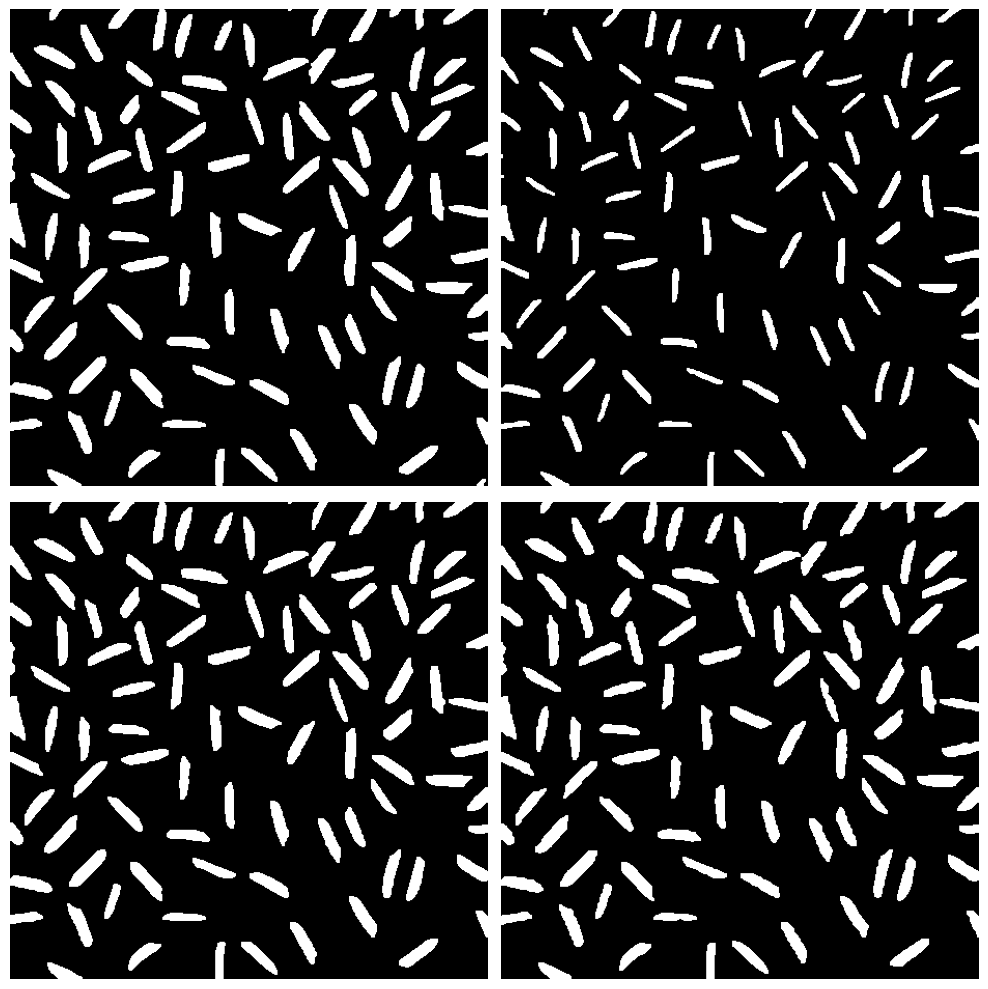

In [19]:
kernel = np.ones((3,3),np.uint8)


local_max_imgs = []
dist_transforms = []
for i in range(4):

    dist_transform = cv2.distanceTransform(images_test[i], cv2.DIST_L2, 0)
    dist_transforms.append(scale_img(dist_transform))
    ret, local_max = cv2.threshold(
        dist_transform, 0.3*dist_transform.max(), 255, 0
    )
    local_max = cv2.dilate(local_max, kernel)
    local_max_imgs.append(scale_img(local_max))


show_images(dist_transforms, grid_size=(2, 2))
show_images(local_max_imgs, grid_size=(2, 2))

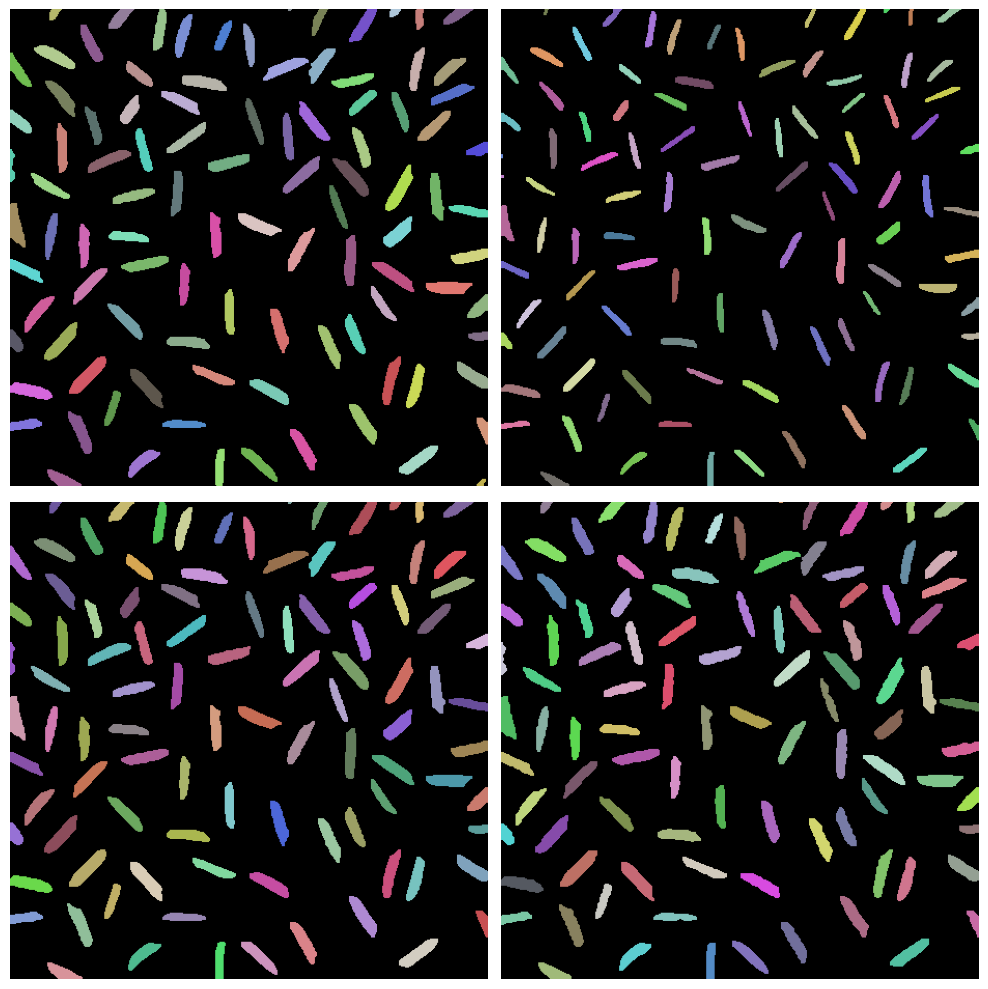

In [20]:
markers_imgs = []

for i in range(4):
    ret, markers = cv2.connectedComponents(local_max_imgs[i])
    segmented_image = np.zeros((local_max_imgs[i].shape[0], local_max_imgs[i].shape[1], 3), dtype=np.uint8)

    for label in range(1, ret):
        color = [np.random.randint(75, 225) for _ in range(3)]
        segmented_image[markers == label] = color

    markers_imgs.append(segmented_image)

show_images(markers_imgs, grid_size=(2, 2))

Number of rice grains in image 1: 100
Number of rice grains in image 2: 99
Number of rice grains in image 3: 99
Number of rice grains in image 4: 99


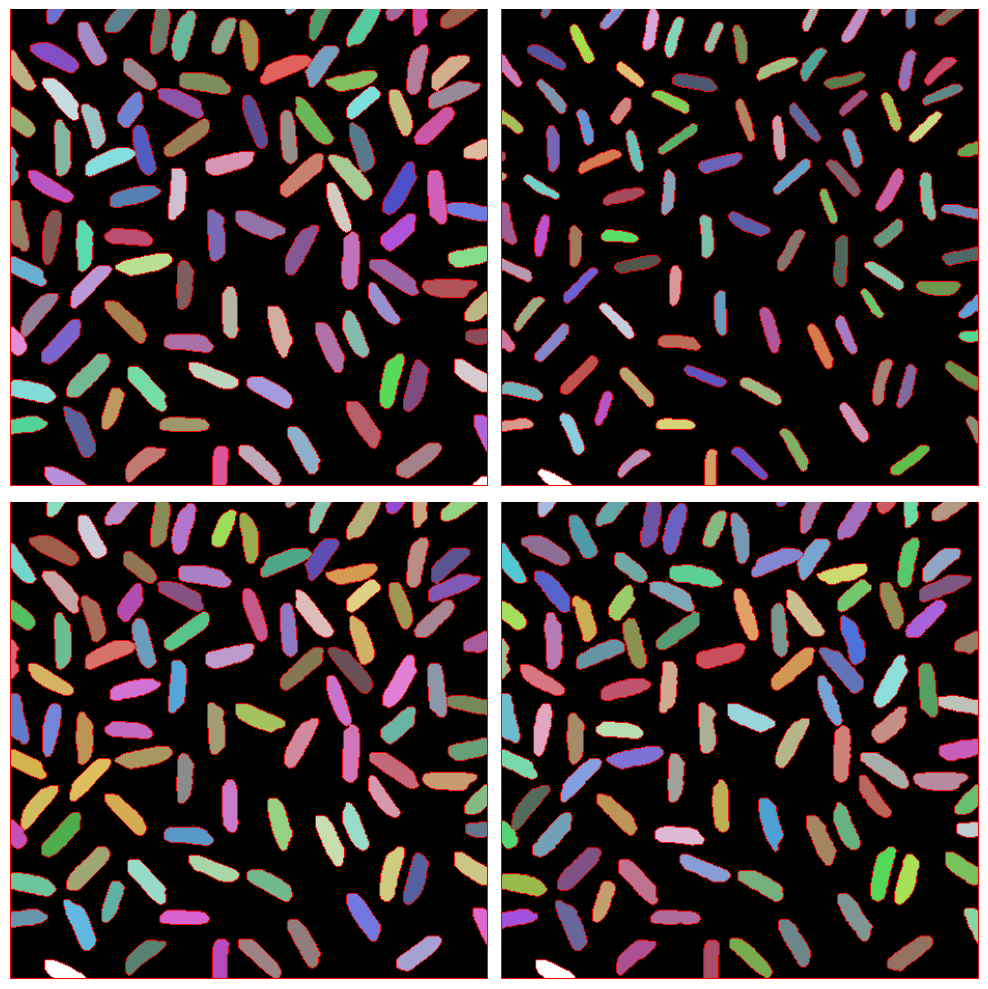

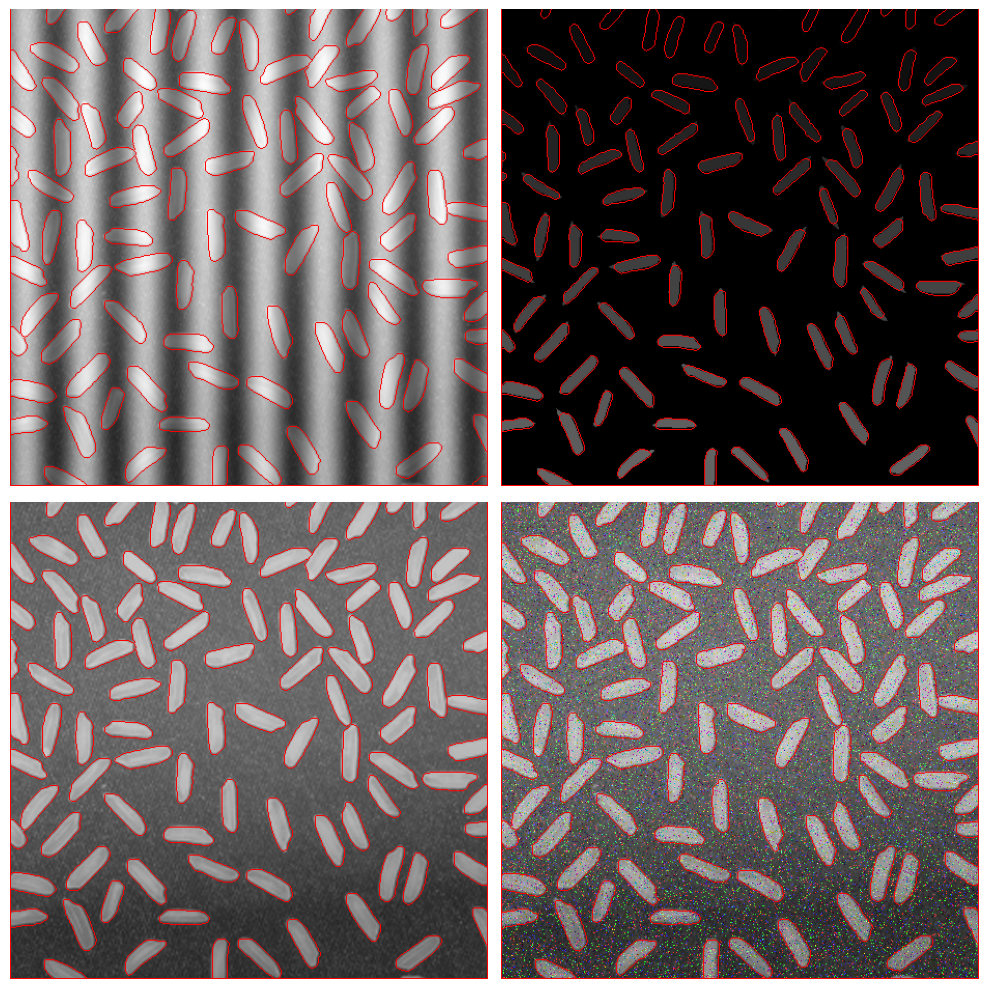

In [21]:
kernel = np.ones((3,3),np.uint8)
result_images = []

for i in range(4):

    sure_bg = cv2.dilate(images_test[i], kernel, iterations=3)

    dist_transform = cv2.distanceTransform(images_test[i], cv2.DIST_L2, 0)
    ret, sure_fg = cv2.threshold(
        dist_transform, 0.3*dist_transform.max(), 255, 0
    )
    sure_fg = cv2.dilate(sure_fg, kernel)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg,sure_fg)

    ret, markers = cv2.connectedComponents(sure_fg)
    print(f'Number of rice grains in image {i + 1}: {ret - 1}')
    
    markers = markers+1
    markers[unknown==255] = 0

    mask = images_test[i]
    mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)

    markers = cv2.watershed(mask, markers)
    mask[markers == -1] = [0,0,255]
    img_mats_BGR[i][markers == -1] = [0,0,255]
    mask[markers == 1] = [0,0,0]
    for label in range(2, ret):
        color = [np.random.randint(75, 225) for _ in range(3)]
        mask[markers == label] = color
    result_images.append(mask)

show_images(result_images, grid_size=(2, 2))
show_images(img_mats_BGR, grid_size=(2, 2))